In [1]:
import sys

sys.path.append('/Volumes/GoogleDrive/My Drive/python_code/connectome_tools/')
sys.path.append('/Volumes/GoogleDrive/My Drive/python_code/maggot_models/')

from pymaid_creds import url, name, password, token
import pymaid

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from graspy.plot import gridplot, heatmap
from graspy.utils import binarize, pass_to_ranks
from src.data import load_metagraph
from src.visualization import CLASS_COLOR_DICT, adjplot

mg = load_metagraph("G", version="2020-04-23", path = '/Volumes/GoogleDrive/My Drive/python_code/maggot_models/data/processed/')
mg.calculate_degrees(inplace=True)

adj = mg.adj  # adjacency matrix from the "mg" object


In [2]:
from src.traverse import to_markov_matrix, RandomWalk

# Random walk test
rm = pymaid.CatmaidInstance(url, name, password, token) # load CATMAID
ORN = pymaid.get_skids_by_annotation('mw ORN') # pull ORN skids
ORN_index = np.where(mg.meta.index == ORN[0])[0][0] # index associated with a particular ORN skid; will use in rw

transition_probs = to_markov_matrix(adj)
rw = RandomWalk(transition_probs, allow_loops=False, stop_nodes=[], max_hops=20)

np.random.seed(0)
rw.start(ORN_index)
print(rw.traversal_)  

np.random.seed(1)
rw.start(ORN_index)
print(rw.traversal_)


INFO  : Global CATMAID instance set. Caching is ON. (pymaid)
[84, 2139, 2915, 2141]
[84, 86, 1970, 33, 1538, 1232, 1721, 1711, 1714, 1713, 1742, 1737, 2417, 1490, 2406, 932, 2069, 1545, 1562, 1026]


In [4]:
# Cascade test
from src.traverse import Cascade, to_transmission_matrix

p = 0.05
transition_probs = to_transmission_matrix(adj, p)
casc = Cascade(transition_probs, max_hops = 3)

np.random.seed(0)
casc.start(ORN_index)
print(casc.traversal_)


[array([84]), array([   8,   86, 2139, 2915, 2945]), array([  10,   11,   12,   14,   21,   22,   24,   26,   27,   38,   40,
         42,   44,   46,   50,   52,   56,   60,   62,   63,   64,   72,
         76,   77,   80,   84,   88,   90,   92,  202,  203,  313,  998,
       1013, 1252, 1395, 1597, 1635, 1655, 1660, 1721, 1728, 1740, 1903,
       2072, 2139, 2140, 2141, 2144, 2200, 2243, 2495, 2555, 2572, 2573,
       2905, 2913, 2915, 2916, 2920, 2945, 2946, 2964, 2966, 2967, 2970,
       2972, 2975, 2977, 2979, 3008, 3011, 3016])]


In [5]:
# Cascade test with multiple neurons

ORNs_index = np.where([x in ORN for x in mg.meta.index])[0] # indices associated with all ORNs

p = 0.05
transition_probs = to_transmission_matrix(adj, p)
casc = Cascade(transition_probs, max_hops = 2)

np.random.seed(0)
casc.start(ORNs_index)
print(casc.traversal_)
print()

[array([ 2,  3,  6,  7, 10, 11, 14, 15, 18, 19, 22, 23, 26, 27, 38, 39, 42,
       43, 46, 47, 50, 51, 54, 55, 58, 59, 62, 63, 68, 69, 72, 73, 76, 77,
       80, 81, 84, 85, 88, 89, 92, 93]), array([   4,    5,    8,    9,   12,   13,   16,   17,   20,   21,   24,
         25,   28,   40,   41,   44,   45,   48,   49,   53,   56,   57,
         60,   61,   64,   65,   70,   71,   74,   75,   78,   79,   83,
         86,   87,   90,   91,   94,   95, 1597, 1634, 1635, 1655, 1707,
       2073, 2136, 2139, 2140, 2141, 2142, 2143, 2144, 2148, 2173, 2174,
       2226, 2243, 2244, 2291, 2333, 2334, 2628, 2656, 2905, 2906, 2913,
       2914, 2915, 2916, 2917, 2918, 2919, 2920, 2945, 2946, 2957, 2959,
       2960, 2962, 2963, 2964, 2965, 2966, 2967, 2970, 2971, 2972, 2973,
       2974, 2975, 2976, 2977, 2978, 2979, 3008, 3009, 3010, 3011, 3012,
       3013, 3014, 3015, 3016, 3017, 3031])]



100%|██████████| 100/100 [00:39<00:00,  2.51it/s]


Text(0, 1, 'Figure x: Hop histogram, cascade starting at ORNs.\nTop - linear scale, Bottom - Log10 scale.\np=0.05, simultaneous=True.')

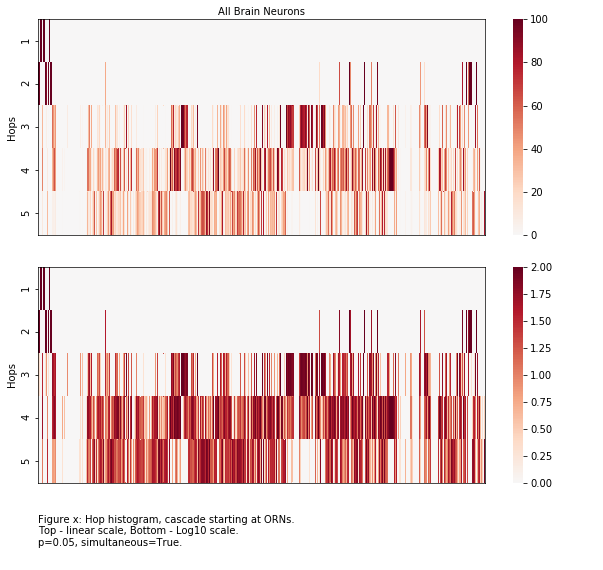

In [8]:
# Plotting test
from src.traverse import TraverseDispatcher
from src.visualization import matrixplot

p = 0.05
max_hops = 5
n_init = 100
simultaneous = True
transition_probs = to_transmission_matrix(adj, p)
start_nodes = ORNs_index

cdispatch = TraverseDispatcher(
    Cascade,
    transition_probs,
    max_hops=max_hops,
    allow_loops = False,
    n_init=n_init,
    simultaneous=simultaneous,
)
hit_hist = cdispatch.multistart(start_nodes)

fig, axs = plt.subplots(
    3, 1, figsize=(10, 10), gridspec_kw=dict(height_ratios=[0.45, 0.45, 0.1])
)

ax = axs[0]
matrixplot(hit_hist.T, ax=ax, cbar=True)
ax.set_xlabel("All Brain Neurons")
ax.set_yticks(np.arange(1, max_hops + 1) - 0.5)
ax.set_yticklabels(np.arange(1, max_hops + 1))
ax.set_ylabel("Hops")
ax = axs[1]
matrixplot(np.log10(hit_hist.T + 1), ax=ax, cbar=True)
ax.set_yticks(np.arange(1, max_hops + 1) - 0.5)
ax.set_yticklabels(np.arange(1, max_hops + 1))
ax.set_ylabel("Hops")
ax = axs[2]
ax.axis("off")
caption = f"Figure x: Hop histogram, cascade starting at ORNs.\n"
caption += "Top - linear scale, Bottom - Log10 scale.\n"
caption += f"p={p}, simultaneous={simultaneous}."
ax.text(0, 1, caption, va="top")


100%|██████████| 100/100 [01:02<00:00,  1.61it/s]


Text(0, 1, 'Figure x: Hop histogram, cascade starting at ORNs.\nTop - linear scale, Bottom - Log10 scale.\np=0.05, simultaneous=True.')

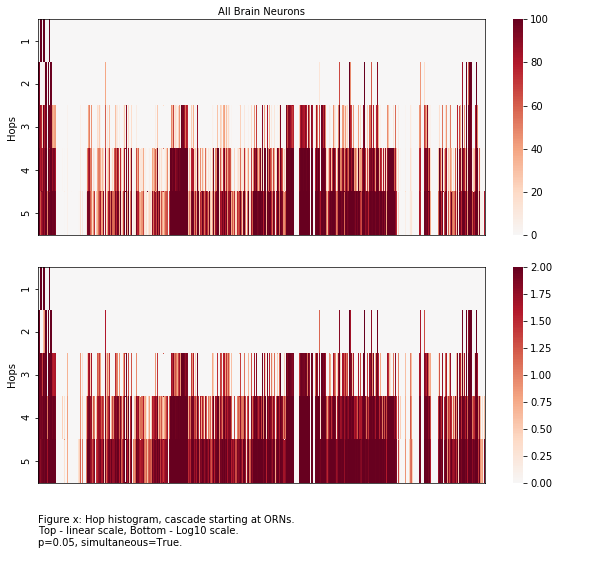

In [9]:
cdispatch = TraverseDispatcher(
    Cascade,
    transition_probs,
    max_hops=max_hops,
    allow_loops = True,
    n_init=n_init,
    simultaneous=simultaneous,
)
hit_hist = cdispatch.multistart(start_nodes)

fig, axs = plt.subplots(
    3, 1, figsize=(10, 10), gridspec_kw=dict(height_ratios=[0.45, 0.45, 0.1])
)

ax = axs[0]
matrixplot(hit_hist.T, ax=ax, cbar=True)
ax.set_xlabel("All Brain Neurons")
ax.set_yticks(np.arange(1, max_hops + 1) - 0.5)
ax.set_yticklabels(np.arange(1, max_hops + 1))
ax.set_ylabel("Hops")
ax = axs[1]
matrixplot(np.log10(hit_hist.T + 1), ax=ax, cbar=True)
ax.set_yticks(np.arange(1, max_hops + 1) - 0.5)
ax.set_yticklabels(np.arange(1, max_hops + 1))
ax.set_ylabel("Hops")
ax = axs[2]
ax.axis("off")
caption = f"Figure x: Hop histogram, cascade starting at ORNs.\n"
caption += "Top - linear scale, Bottom - Log10 scale.\n"
caption += f"p={p}, simultaneous={simultaneous}."
ax.text(0, 1, caption, va="top")
#stashfig(f"hop-hist-cascade-p{p}-simult{simultaneous}")